In [1]:
using DifferentialEquations
using Plots

In [5]:
push!(LOAD_PATH,"../src/nbody")
using NBody

In [6]:
ndim = 2
m1 = 1.0
m2 = 1.0
abin = 10.0
ebin = 0.95
qb, pb, period = init_data_binary(ndim, m1, m2, abin, ebin)

([[0.2500000000000002, 0.0], [-0.2500000000000002, 0.0]], [[0.0, 1.3964240043768934], [-0.0, -1.3964240043768934]], 140.49629462081452)

In [7]:
mass = Float64[m1, m2]
bb = Bodies(qb, pb, mass, 1.0)

Bodies(2, 2, [1.0, 1.0], [0.2500000000000002, 0.0, -0.2500000000000002, 0.0, 0.0, 1.3964240043768934, -0.0, -1.3964240043768934], 1.0)

In [8]:
tf = 10.0*period
time = (0.0,tf)
dt = 0.005
prob = ODEProblem(NBody.nbdy_eqs!, bb.u, time, bb);
sol = solve(prob, Vern9(), reltol=1.0e-12, abstol=1.0e-12, saveat=dt);

In [9]:
s1x = sol[1,:]
s1y = sol[2,:]
s2x = sol[3,:]
s2y = sol[4,:];

In [10]:
plot(s1x,s1y,aspect_ratio=:equal)
plot!(s2x,s2y,aspect_ratio=:equal)

In [11]:
a1 = Animation()
outfreq::Int64 = 1000
lim::Float64 = 10.0
tail::Int64 = 5000
xrange = (-lim, lim)
yrange = (-lim, lim)
label1 = string("Mass=", m1)
label2 = string("Mass=", m2)
n = length(sol.t)
for i = 1:outfreq:n
    bi = max(1,i-tail)
    ei = i
    inds = bi:ei
    plt = plot( s1x[inds], s1y[inds], xlim=xrange, ylim=yrange, aspect_ratio=:equal, label=false, color = :blue)
    plt = plot!(s2x[inds], s2y[inds], label=false, color = :red)
    plt = plot!([s1x[i]], [s1y[i]], seriestype = :scatter, color=:blue, label=label1)
    plt = plot!([s2x[i]], [s2y[i]], seriestype = :scatter, color=:red, label=label2)
    frame(a1, plt)
end

┌ Info: Saved animation to 
│   fn = /Users/dwn8/.julia/dev/numex/examples/orbit2D.gif
└ @ Plots /Users/dwn8/.julia/packages/Plots/lW9ll/src/animation.jl:137


Plots.AnimatedGif("/Users/dwn8/.julia/dev/numex/examples/orbit2D.gif")
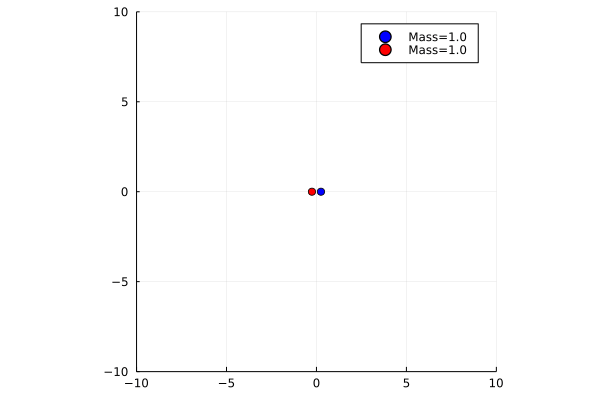

In [12]:
gif(a1, "orbit2D.gif")

In [13]:
@userplot NbodyPlot
@recipe function f(lp::NbodyPlot)
    x, y, z, i = lp.args
    n = length(x)
    #inds = circshift(1:n, 1-i)
    bi = max(1,i-10)
    ei = i
    inds = bi:ei
    #seriesalpha --> range(0, 1, length=n)
    aspect_ratio --> 1
    label --> false
    lim = -10.0
    xlim --> (-lim,lim)
    ylim --> (-lim, lim)
    zlim --> (-lim, lim)
    x[inds], y[inds], z[inds]
end

In [14]:
m1 = 1.0
m2 = 1.0
abin = 2.0
ebin=0.0
m3 = 0.01
a3 = 5.0
e3 = 0.5
q3, p3, per3 = init_data_3bodies(ndim, m1, m2, m3, abin, ebin, a3, e3)

([[1.0124378109452736, 0.0], [-0.9875621890547264, 0.0], [-2.4875621890547266, 0.0]], [[6.187965644414636e-5, 0.5054364016388871], [6.187965644414636e-5, -0.4945635983611129], [-0.00012375931288829487, -0.010872803277774191]], 49.54922272758475)

In [15]:
mass3 = Float64[m1, m2, m3]
bb3 = Bodies(q3, p3, mass3, 1.0)

Bodies(2, 3, [1.0, 1.0, 0.01], [1.0124378109452736, 0.0, -0.9875621890547264, 0.0, -2.4875621890547266, 0.0, 6.187965644414636e-5, 0.5054364016388871, 6.187965644414636e-5, -0.4945635983611129, -0.00012375931288829487, -0.010872803277774191], 1.0)

In [16]:
tf3 = 6.0*per3
time = (0.0,tf3)
dt = 0.05
prob3 = ODEProblem(NBody.nbdy_eqs!, bb3.u, time, bb3);
sol3 = solve(prob3, Vern9(), reltol=1.0e-12, abstol=1.0e-12, saveat=dt);
#sol3 = solve(prob3, AutoVern7(Rodas5()), reltol=1.0e-12, abstol=1.0e-12, saveat=dt);

In [17]:
w1x = sol3[1,:]
w1y = sol3[2,:]
w2x = sol3[3,:]
w2y = sol3[4,:]
w3x = sol3[5,:]
w3y = sol3[6,:];

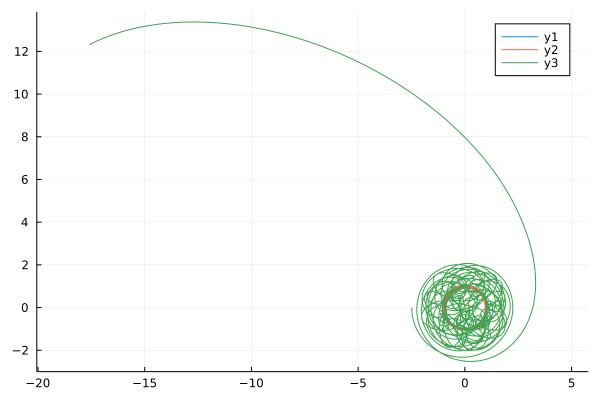

In [18]:
plot(w1x,w1y,aspect_ratio=:equal)
plot!(w2x,w2y,aspect_ratio=:equal)
plot!(w3x,w3y,aspect_ratio=:equal)
#plot!(w3x,w3y,xlim=(-30,30),ylim=(-30,30),aspect_ratio=:equal)

In [19]:
aa = Animation()
outfreq = 2
lim = 3.0
tail = 50
xrange = (-lim, lim)
yrange = (-lim, lim)
label1 = string("Mass=", m1)
label2 = string("Mass=", m2)
label3 = string("Mass=", m3)
n = length(sol3.t)
for i = 1:outfreq:n
    bi = max(1,i-tail)
    ei = i
    inds = bi:ei
    plt = plot( w1x[inds], w1y[inds], xlim=xrange, ylim=yrange, aspect_ratio=:equal, label=false, color = :blue)
    plt = plot!(w2x[inds], w2y[inds], label=false, color = :red)
    plt = plot!(w3x[inds], w3y[inds], label=false, color = :green)
    plt = plot!([w1x[i]], [w1y[i]], seriestype = :scatter, color=:blue, label=label1)
    plt = plot!([w2x[i]], [w2y[i]], seriestype = :scatter, color=:red, label=label2)
    plt = plot!([w3x[i]], [w3y[i]], seriestype = :scatter, color=:green, label=label3)
    frame(aa, plt)
end

┌ Info: Saved animation to 
│   fn = /Users/dwn8/.julia/dev/numex/examples/3body2D.gif
└ @ Plots /Users/dwn8/.julia/packages/Plots/lW9ll/src/animation.jl:137


Plots.AnimatedGif("/Users/dwn8/.julia/dev/numex/examples/3body2D.gif")
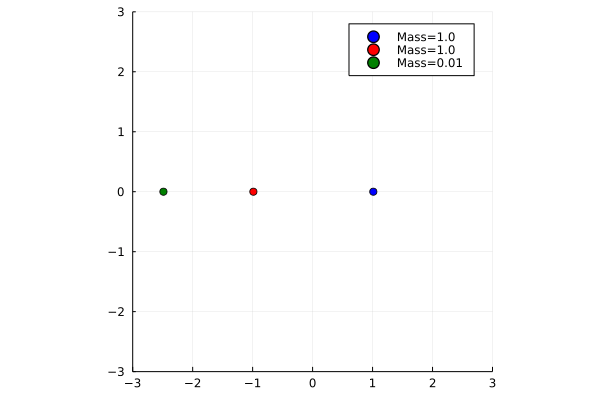

In [20]:
gif(aa, "3body2D.gif", fps=30)